## 1. IMPORTS

In [1]:
import os
print(f"# --- VERIFICATION DU REPERTOIRE COURANT : {os.getcwd()}")
import sys
# --- ACCES A SRC
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
src_path = os.path.join(project_root, "src")

# ---AJOUT DE src AU sys.path
if src_path not in sys.path:
    sys.path.append(src_path)
print(f"# --- CHEMIN AJOUTE AU sys.path : {src_path}")
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sentence_transformers import SentenceTransformer
import evidently
print(f"# --- POUR CE PROJET NOUS UTILISONS CETTE VERSION DE EVIDENTLYAI : {evidently.__version__}")

# --- VERIFICATION DU REPERTOIRE COURANT : d:\machine_learning_training\openclassrooms_projects\05_categorisez_automatiquement_question\notebooks
# --- CHEMIN AJOUTE AU sys.path : d:\machine_learning_training\openclassrooms_projects\05_categorisez_automatiquement_question\src
# --- POUR CE PROJET NOUS UTILISONS CETTE VERSION DE EVIDENTLYAI : 0.5.1


## 2. CHARGEMENT DES DONNEES

In [2]:
# --------------------------------------
# --- CHARGEMENT DES DONNEES PRINCIPALES
# --------------------------------------
full_explo_wo = pd.read_csv("../data/processed/full_explo_wo_wet.csv")

print(f"""# --- DIMENSIONS DONNEES NETTOYEES SANS LES TAGS ENCODES :\n{full_explo_wo.shape}""")
print(f"""# --- COLONNES : \n{full_explo_wo.columns}""")

# --- DIMENSIONS DONNEES NETTOYEES SANS LES TAGS ENCODES :
(9091, 17)
# --- COLONNES : 
Index(['PostId', 'Title', 'Body', 'Score', 'ViewCount', 'AnswerCount',
       'CreationDate', 'TagCount', 'Tags', 'clean_title_body',
       'clean_title_body_w2v', 'clean_title_body_embed', 'title_body_raw',
       'length_words_raw', 'length_words_clean', 'reduction_ratio_global',
       'is_outlier'],
      dtype='object')


## 3. DECOUPAGE TEMPOREL DES DONNEES

In [3]:
# --------------------------------------------------------------------------------------------------------------
# --- ON CONVERTIT AU FORMAT DATETIME POUR EXPLOITER LA COLONNE QUI PERMETTRA LE DECOUPAGE TEMPOREL DES DONNEES
# --------------------------------------------------------------------------------------------------------------
full_explo_wo["CreationDate"] = pd.to_datetime(full_explo_wo["CreationDate"])
# ----------------------------------------------------------------------------------------------
# --- ON CREE LA COLONNE MOIS POUR IDENTIFIER LE MOIS DE LA DATE DE CREATION DE CHAQUE QUESTION
# ----------------------------------------------------------------------------------------------
# --- FORMAT  yyyy-mm
full_explo_wo["CreationMonth"] = full_explo_wo["CreationDate"].dt.to_period("M")
# --------------------------------
# ON REGROUPE LES CORPUS PAR MOIS
# --------------------------------
# --- LE CORPUS CHOISI EST SPECIFIQUE AU MODELE QUI SERA APPLIQUE POUR L'ANALYSE DRIFT (MODELE SBERT)
monthly_texts = {
    str(month): group["clean_title_body_embed"].tolist()
    for month, group in full_explo_wo.groupby("CreationMonth")
}
print(f"# --- MOIS DISPONIBLES A L'ANALYSE : \n{list(monthly_texts.keys())}")
# ----------------------------------------
# --- CREATION D'UN DICT DE DATAFRAMES MENSUELS
# ----------------------------------------
monthly_dfs = {
    str(month): group.reset_index(drop=True)
    for month, group in full_explo_wo.groupby("CreationMonth")
}
print(f"# --- LES TAGS DES QUESTIONS DE JANVIER 2015 SONT : \n{monthly_dfs["2015-01"]["Tags"]}")

# --- MOIS DISPONIBLES A L'ANALYSE : 
['2008-08', '2008-09', '2008-10', '2008-11', '2008-12', '2009-01', '2009-02', '2009-03', '2009-04', '2009-05', '2009-06', '2009-07', '2009-08', '2009-09', '2009-10', '2009-11', '2009-12', '2010-01', '2010-02', '2010-03', '2010-04', '2010-05', '2010-06', '2010-07', '2010-08', '2010-09', '2010-10', '2010-11', '2010-12', '2011-01', '2011-02', '2011-03', '2011-04', '2011-05', '2011-06', '2011-07', '2011-08', '2011-09', '2011-10', '2011-11', '2011-12', '2012-01', '2012-02', '2012-03', '2012-04', '2012-05', '2012-06', '2012-07', '2012-08', '2012-09', '2012-10', '2012-11', '2012-12', '2013-01', '2013-02', '2013-03', '2013-04', '2013-05', '2013-06', '2013-07', '2013-08', '2013-09', '2013-10', '2013-11', '2013-12', '2014-01', '2014-02', '2014-03', '2014-04', '2014-05', '2014-06', '2014-07', '2014-08', '2014-09', '2014-10', '2014-11', '2014-12', '2015-01', '2015-02', '2015-03', '2015-04', '2015-05', '2015-06', '2015-07', '2015-08', '2015-09', '2015-10', '201

## 4. SELECTION TEMPORELLE DES DONNEES

# --- APRES FILTRAGE, DONNEES DISPONIBLES POUR CETTE PERIODE :
- 2014-01 : 107 textes
- 2014-02 : 113 textes
- 2014-03 : 113 textes
- 2014-04 : 98 textes
- 2014-05 : 73 textes
- 2014-06 : 99 textes
- 2014-07 : 99 textes
- 2014-08 : 90 textes
- 2014-09 : 95 textes
- 2014-10 : 87 textes
- 2014-11 : 87 textes
- 2014-12 : 75 textes
# --- STATISTIQUES SUR LA DISPERSION DU NOMBRE DE TEXTES :
count     12.000000
mean      94.666667
std       13.033756
min       73.000000
25%       87.000000
50%       96.500000
75%      101.000000
max      113.000000
Name: nb_textes, dtype: float64


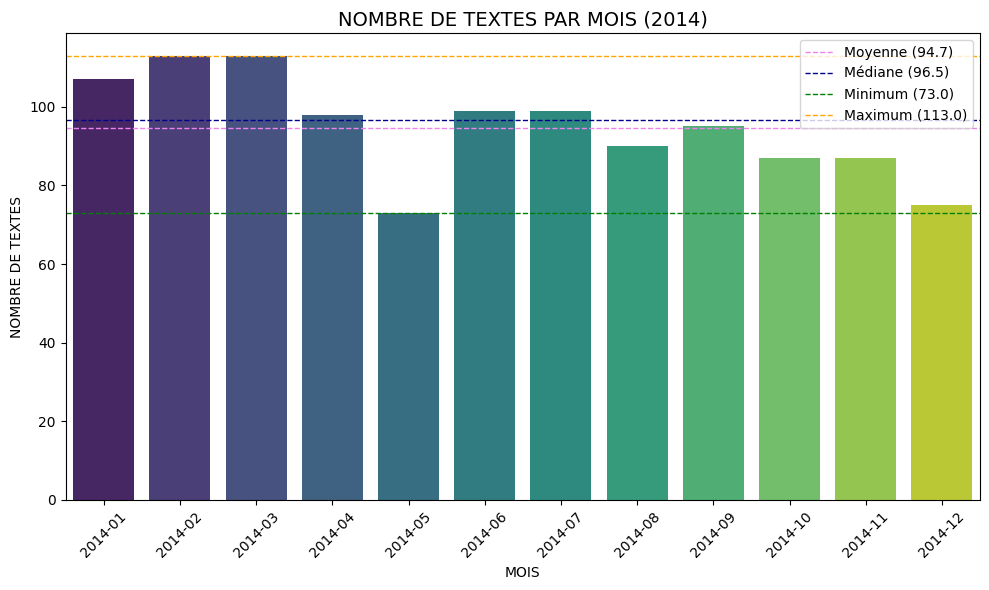

In [4]:
# -------------------------------------------------------------
# FILTRAGE DES DONNEES : ON NE GARDE QU'UNE PERIODE DE 12 MOIS
# -------------------------------------------------------------
# --- SELECTION DES MOIS DE JANVIER A DECEMBRE 2014
selected_months = [
    '2014-01', '2014-02', '2014-03', '2014-04',
    '2014-05', '2014-06', '2014-07', '2014-08',
    '2014-09', '2014-10', '2014-11', '2014-12'
]
# --- FILTRAGE DES DONNEES
monthly_dfs_filtered = {
    month: monthly_dfs[month]
    for month in selected_months
    if month in monthly_dfs
}
# --- VERIFICATION DU FILTRAGE
print("# --- APRES FILTRAGE, DONNEES DISPONIBLES POUR CETTE PERIODE :")
for month, df in monthly_dfs_filtered.items():
    print(f"- {month} : {len(df)} textes")
    
# -------------------------------
# --- ANALYSE DESCRIPTIVE RAPIDE
# -------------------------------
# --- CREATION DATAFRAME AVEC VOLUME TEXTUEL POUR CHAQUE MOIS DE DONNEES
volume_df = pd.DataFrame({
    'mois': list(monthly_dfs_filtered.keys()),
    'nb_textes': [len(df) for df in monthly_dfs_filtered.values()]
})
# --- STATISTIQUES DESCRIPTIVES
print("# --- STATISTIQUES SUR LA DISPERSION DU NOMBRE DE TEXTES :")
print(volume_df['nb_textes'].describe())
# -------------------------------------------------------------------------------------
# --- VISUALISATION DE LA DISTRIBUTION DE TEXTE SUR LES MOIS DE LA PERODE SELECTIONNEE
# -------------------------------------------------------------------------------------
# --- CREATION BARPLOT
plt.figure(figsize=(10, 6))
sns.barplot(x='mois', y='nb_textes', data=volume_df, hue='mois', palette='viridis', dodge=False, legend=False)
# --- QUELQUES CHIFFRES POUR AFFICHER DES REPERES VISUELS
mean_volume = volume_df['nb_textes'].mean()
median_volume = volume_df['nb_textes'].median()
min_volume = volume_df['nb_textes'].min()
max_volume = volume_df['nb_textes'].max()
plt.axhline(mean_volume, color='violet', linestyle='--', linewidth=1, label=f'Moyenne ({mean_volume:.1f})')
plt.axhline(median_volume, color='darkblue', linestyle='--', linewidth=1, label=f'Médiane ({median_volume:.1f})')
plt.axhline(min_volume, color='green', linestyle='--', linewidth=1, label=f'Minimum ({min_volume:.1f})')
plt.axhline(max_volume, color='orange', linestyle='--', linewidth=1, label=f'Maximum ({max_volume:.1f})')
plt.title("NOMBRE DE TEXTES PAR MOIS (2014)", fontsize=14)
plt.xlabel("MOIS")
plt.ylabel("NOMBRE DE TEXTES")
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

## 5. ENCODAGE SBERT DES CORPUS MENSUELS

In [5]:
# -------------------------------------------
# --- RECHARGEMENT DES MODULES D' EXPLORATION
# -------------------------------------------
import importlib
import tags_suggester.eda.eda_analysis as eda
importlib.reload(eda)

# --------------------------------------------------------------------------------
# CHARGEMENT DU MODELE SBERT SAUVEGARDE LORS DE LA PHASE EXPLORATOIRE DU PROJET
# --------------------------------------------------------------------------------
model = SentenceTransformer("models/sbert/sbert_model")
# --------------------------------------------
# --- ENCODAGE SBERT DES TEXTES DE CHAQUE MOIS
# --------------------------------------------
monthly_embeddings = {}
print("\n# --- ENCODAGE SBERT EN COURS ...")
for month, df in monthly_dfs_filtered.items():
    texts = df["clean_title_body_embed"].fillna("").tolist()
    print(f"# --- POUR LE MOIS DE {month} : {len(texts)} TEXTES A ENCODER ---")
    embeddings = eda.encode_sbert_corpus(texts, model=model, batch_size=32)
    monthly_embeddings[month] = embeddings
    print(f"# --- ENCODAGE EFFECTUE POUR LE MOIS DE {month} → shape : {embeddings.shape} ---")

print("\n# --- TOUS LES MOIS ONT BIEN ETE ENCODES AVEC SUCCES.")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
d:\machine_learning_training\openclassrooms_projects\05_categorisez_automatiquement_question\venv\Lib\site-packages\tensorflow_hub\__init__.py:61: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import parse_version




# --- ENCODAGE SBERT EN COURS ...
# --- POUR LE MOIS DE 2014-01 : 107 TEXTES A ENCODER ---
# --- ENCODAGE EFFECTUE POUR LE MOIS DE 2014-01 → shape : (107, 384) ---
# --- POUR LE MOIS DE 2014-02 : 113 TEXTES A ENCODER ---
# --- ENCODAGE EFFECTUE POUR LE MOIS DE 2014-02 → shape : (113, 384) ---
# --- POUR LE MOIS DE 2014-03 : 113 TEXTES A ENCODER ---
# --- ENCODAGE EFFECTUE POUR LE MOIS DE 2014-03 → shape : (113, 384) ---
# --- POUR LE MOIS DE 2014-04 : 98 TEXTES A ENCODER ---
# --- ENCODAGE EFFECTUE POUR LE MOIS DE 2014-04 → shape : (98, 384) ---
# --- POUR LE MOIS DE 2014-05 : 73 TEXTES A ENCODER ---
# --- ENCODAGE EFFECTUE POUR LE MOIS DE 2014-05 → shape : (73, 384) ---
# --- POUR LE MOIS DE 2014-06 : 99 TEXTES A ENCODER ---
# --- ENCODAGE EFFECTUE POUR LE MOIS DE 2014-06 → shape : (99, 384) ---
# --- POUR LE MOIS DE 2014-07 : 99 TEXTES A ENCODER ---
# --- ENCODAGE EFFECTUE POUR LE MOIS DE 2014-07 → shape : (99, 384) ---
# --- POUR LE MOIS DE 2014-08 : 90 TEXTES A ENCODER ---
# --- 

In [7]:
# 6. ANALYSE DE DRIFT ENTRE MOIS AVEC EVIDENTLY (VERSION 0.5.1)
from evidently import ColumnMapping
from evidently.report import Report
from evidently.metric_preset import DataDriftPreset




In [ ]:
# Choix des mois
reference_month = "2014-01"
current_month = "2014-02"

# Récupération des embeddings SBERT encodés
reference_embeddings = monthly_embeddings[reference_month]
current_embeddings = monthly_embeddings[current_month]

# Construction des DataFrames Evidently
reference_df = pd.DataFrame(reference_embeddings)
current_df = pd.DataFrame(current_embeddings)
# Renommer les colonnes en str pour Evidently
reference_df.columns = reference_df.columns.astype(str)
current_df.columns = current_df.columns.astype(str)

# Définition du ColumnMapping
column_mapping = ColumnMapping(
    numerical_features=reference_df.columns.tolist(),
    categorical_features=[],
    target=None,
    prediction=None
)

# Création du rapport Evidently
drift_report = Report(metrics=[DataDriftPreset()])
drift_report.run(reference_data=reference_df, current_data=current_df, column_mapping=column_mapping)

# Affichage du rapport dans le notebook
drift_report.show()
